### Importing necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Loading the data and getting basic information

In [16]:
df = pd.read_csv('../data/creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [4]:
df[['Amount']].describe()

,Amount
count,284807.000000
mean,88.349619
std,250.120109
min,0.000000
25%,5.600000
50%,22.000000
75%,77.165000
max,25691.160000


## EXploratory Data Analysis

#### Checking for class imbalance

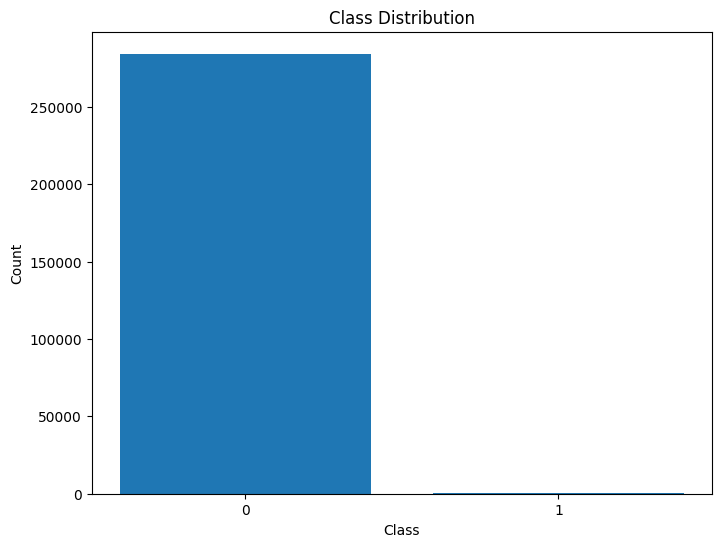

In [5]:
# checking for class imbalance
class_counts = df['Class'].value_counts()

plt.figure(figsize=(8, 6))
plt.bar(class_counts.index, class_counts)
plt.xticks([0, 1], ['0', '1'])
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

#### Distribution of features: How are numerical features distributed (e.g., normal, skewed)?

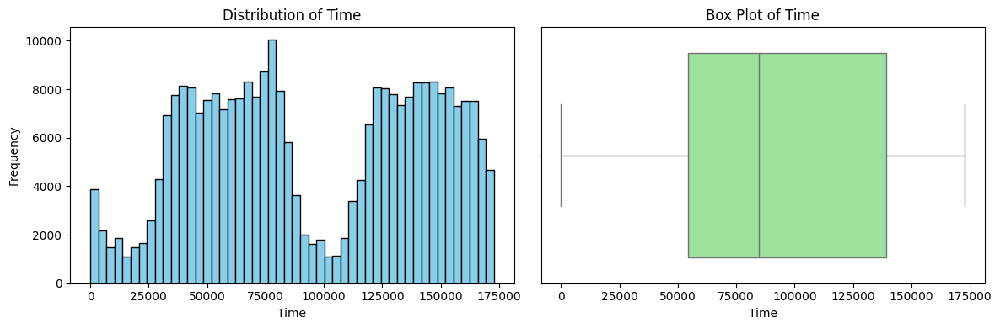

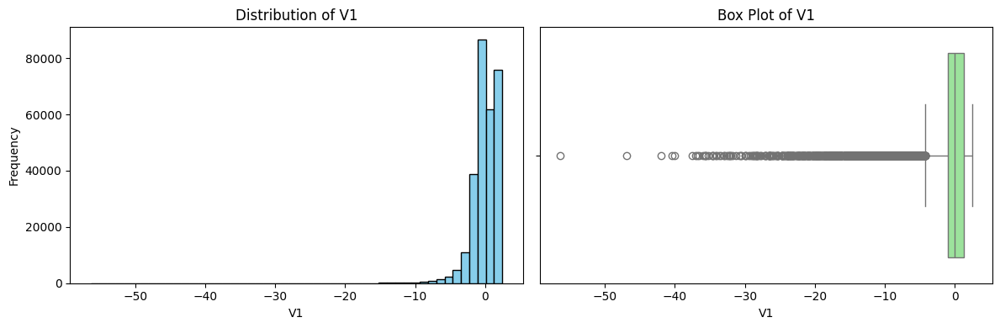

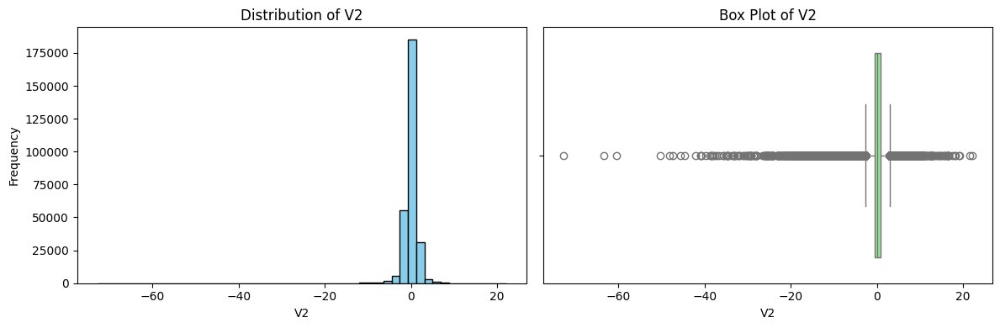

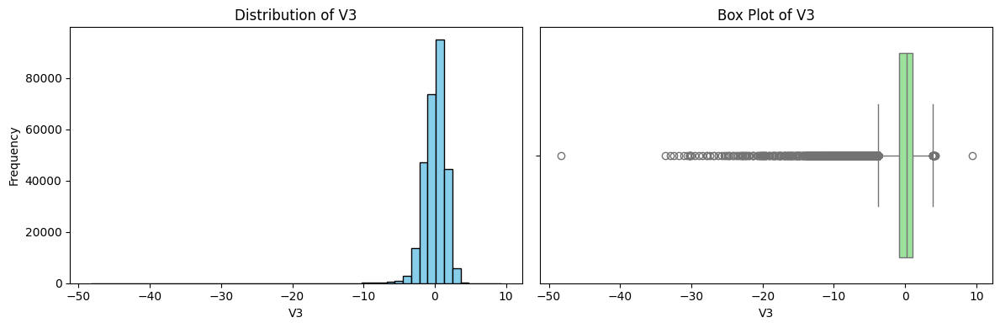

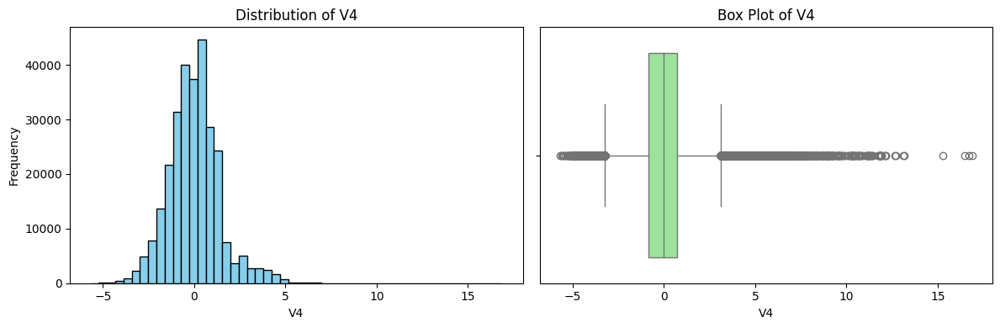

...

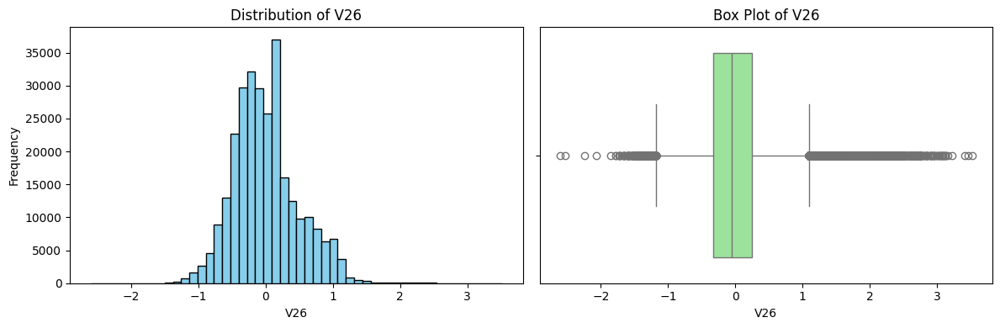

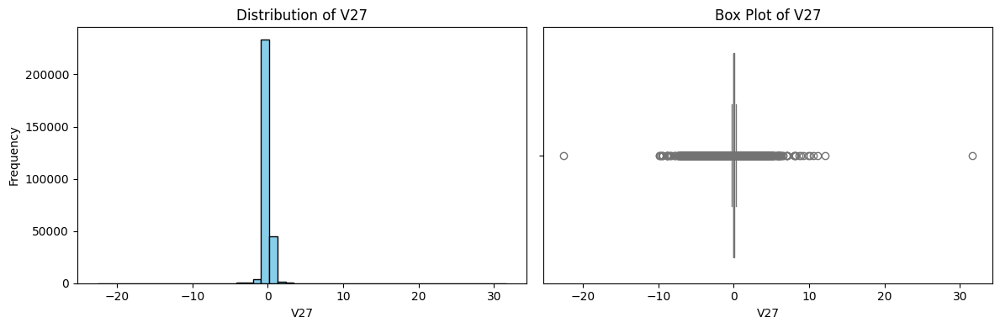

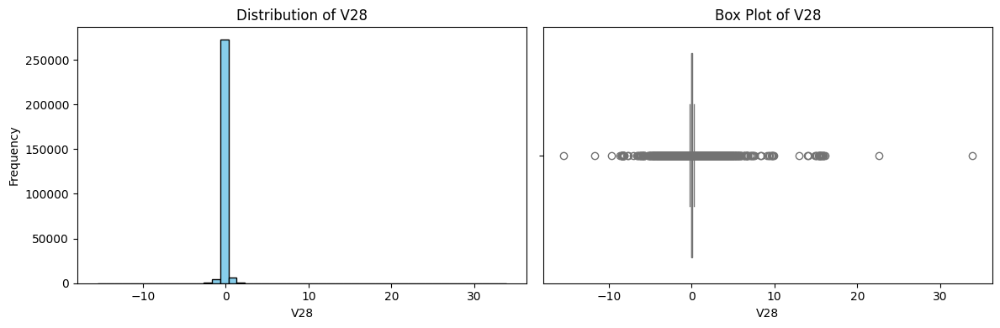

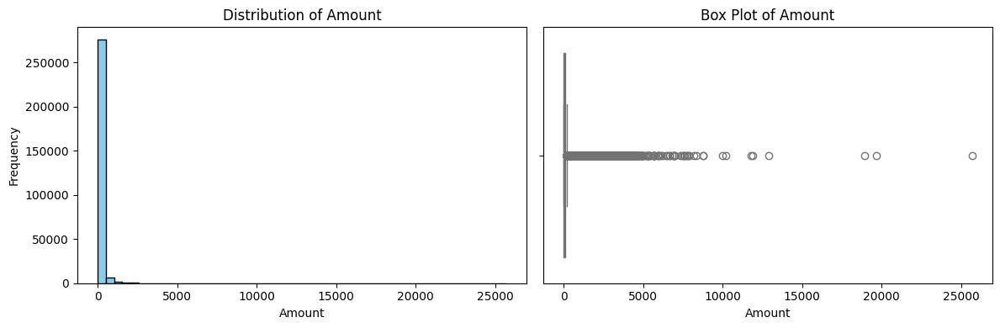

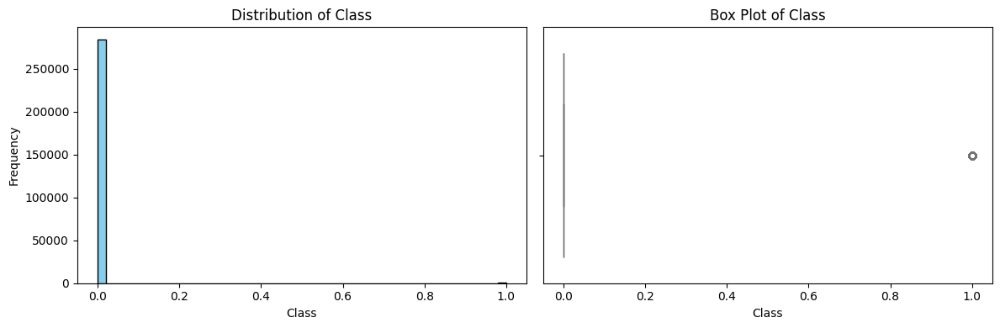

In [6]:
# Get a list of numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns

# Assuming df is your DataFrame and numerical_columns contains the list of columns
for column in numerical_columns:
    # Adjust the overall figure size (width x height)
    fig, axis = plt.subplots(1, 2, figsize=(12, 4))  # You can adjust the (width, height)

    # Plot the histogram on the first axis
    axis[0].hist(df[column], bins=50, color='skyblue', edgecolor='black')
    axis[0].set_xlabel(column)
    axis[0].set_ylabel('Frequency')
    axis[0].set_title(f'Distribution of {column}')

    # Plot the boxplot on the second axis
    sns.boxplot(x=df[column], ax=axis[1], color='lightgreen')
    axis[1].set_xlabel(column)
    axis[1].set_title(f'Box Plot of {column}')

    # Adjust the layout to prevent overlap
    plt.tight_layout()

    # Show the combined plots
    plt.show()

#### Correlations between features: Are there any strong correlations that might indicate redundant information?

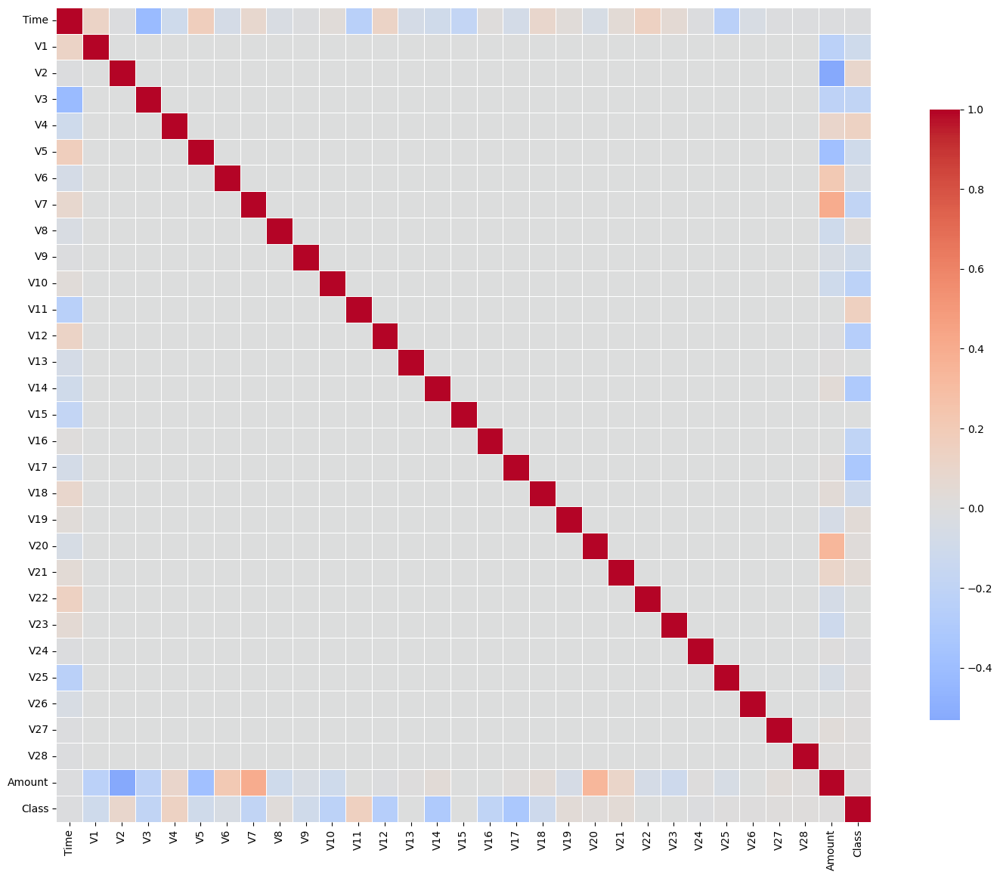

In [7]:

matrix = df.corr()
plt.figure(figsize=(20, 14))  # Set the figure size (width, height)
sns.heatmap(matrix, annot=False, cmap='coolwarm', center=0, square=True, linewidths=0.5, cbar_kws={"shrink": 0.75})
plt.show()

#### Differences between fraudulent and non-fraudulent transactions: Are there any distinct patterns or characteristics that differentiate the two classes?

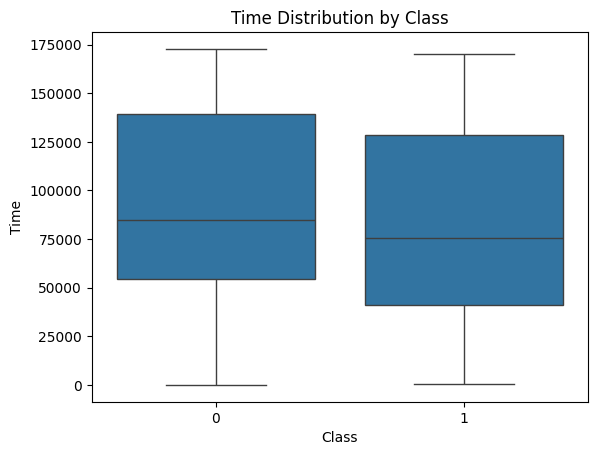

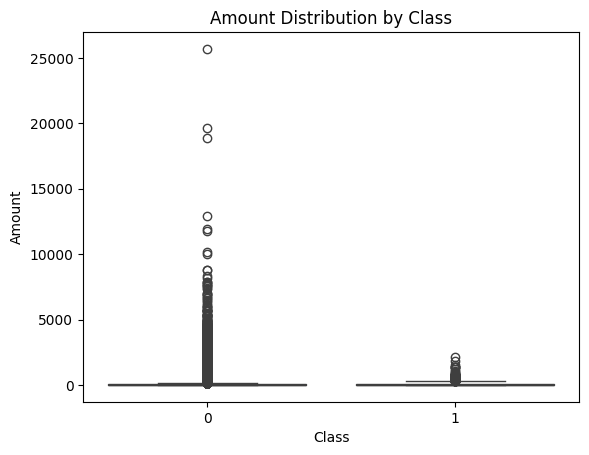

In [8]:
# Compare distributions between classes
sns.boxplot(x='Class', y='Time', data=df)
plt.title('Time Distribution by Class')
plt.show()

sns.boxplot(x='Class', y='Amount', data=df)
plt.title('Amount Distribution by Class')
plt.show()

#### Time-based patterns: Analyze trends over time.

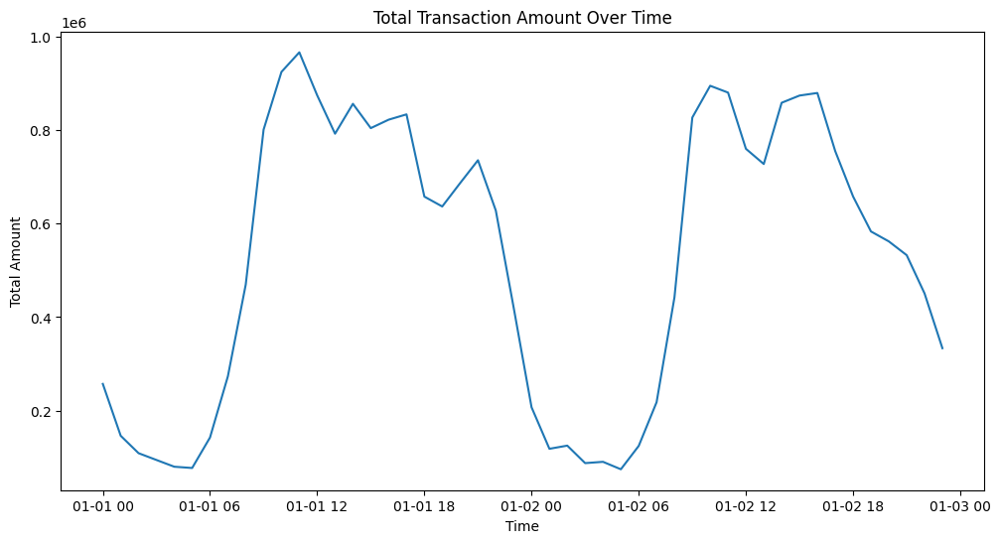

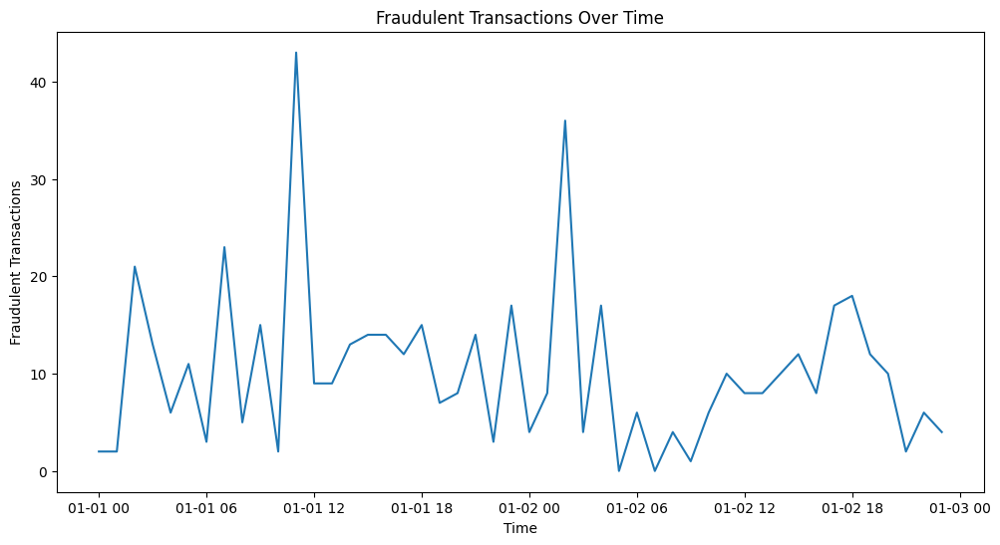

In [9]:
df['Time'] = pd.to_datetime(df['Time'], unit='s')

# Group transactions by hourly intervals and calculate total amounts and fraud counts
df_hourly = df.groupby(pd.Grouper(key='Time', freq='h')).agg({'Amount': 'sum', 'Class': 'sum'})

# Plot total transaction amounts over time
plt.figure(figsize=(12, 6))
plt.plot(df_hourly.index, df_hourly['Amount'])
plt.xlabel('Time')
plt.ylabel('Total Amount')
plt.title('Total Transaction Amount Over Time')
plt.show()

# Plot the count of fraudulent transactions over time
plt.figure(figsize=(12, 6))
plt.plot(df_hourly.index, df_hourly['Class'])
plt.xlabel('Time')
plt.ylabel('Fraudulent Transactions')
plt.title('Fraudulent Transactions Over Time')
plt.show()

In [10]:
# Create the pair plot
df_sample = df.sample(n=1000)
ax = sns.pairplot(df_sample, hue='Class')

# Move the legend
sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, 1), ncol=3, title="Pair Plot of Credit Card Dataset", frameon=False
)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [11]:
column_names = df.columns
column_names

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

C:\Users\user\AppData\Local\Temp\ipykernel_11640\2555537451.py:8: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\user\Documents\upgrad\find-default\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


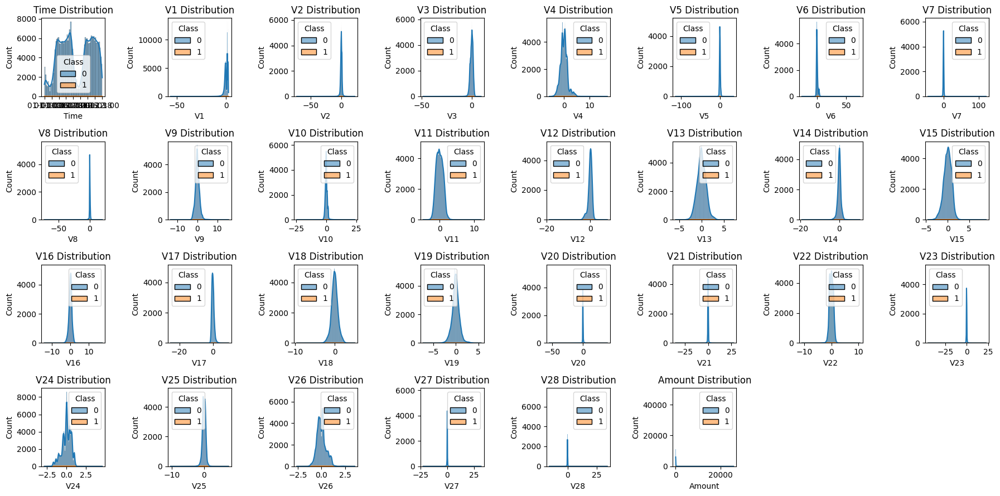

In [12]:
# Visualize the distribution of each feature using histograms.
plt.figure(figsize=(18, 9))
column_names = df.columns
for i, feature in enumerate(column_names[:-1]):
    plt.subplot(4, 8, i + 1)
    sns.histplot(data=df, x=feature, hue='Class', kde=True)
    plt.title(f'{feature} Distribution')
plt.tight_layout()
plt.show()


### Feature Importance

In [17]:
X = df.drop('Class', axis=1)
y = df['Class']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a random forest classifier. Random forest was chosen because it is not sensitive to outliers.
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Feature importance
feature_importance = pd.Series(clf.feature_importances_, index=X.columns)
print(feature_importance)


Time      0.011483
V1        0.013571
V2        0.014254
V3        0.017354
V4        0.026836
V5        0.010974
V6        0.012779
V7        0.029779
V8        0.012491
V9        0.034041
V10       0.081180
V11       0.057915
V12       0.134762
V13       0.009904
V14       0.124600
V15       0.012274
V16       0.074701
V17       0.157517
V18       0.028360
V19       0.013492
V20       0.014014
V21       0.018426
V22       0.010948
V23       0.008286
V24       0.010664
V25       0.008405
V26       0.017162
V27       0.010766
V28       0.010401
Amount    0.012663
dtype: float64


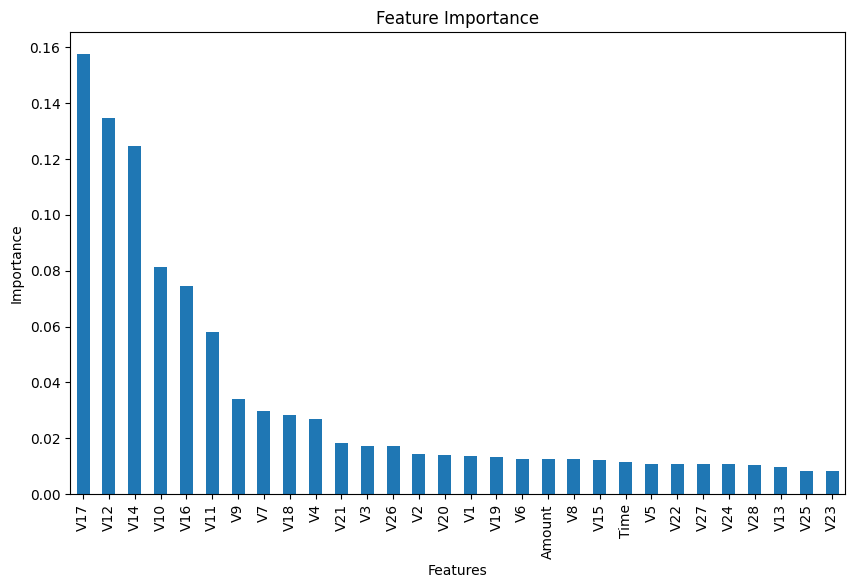

In [ ]:
# Sort the feature importances in descending order for better visualization
feature_importance = feature_importance.sort_values(ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
feature_importance.plot(kind='bar')
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

### Base Model

In [23]:
from sklearn.metrics import accuracy_score, r2_score, recall_score, precision_score

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Evaluate model accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

r2_score = r2_score(y_test, y_pred)
print(f"r2 score: {r2_score:.4f}")

recall_score = recall_score(y_test, y_pred)
print(f"recall score: {recall_score:.4f}")

precision_score = precision_score(y_test, y_pred)
print(f"precision score: {precision_score:.4f}")

Test Accuracy: 0.9996
r2 score: 0.7445
recall score: 0.7653
precision score: 0.9740
